In [16]:
# Load packages and directories


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

import os
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.subplots as sp
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px
import seaborn as sns
import importlib
import requests

import preparing_for_bill as pfb
import json
import re
import pickle 
import geopandas as gpd
base_directory = "C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning"
raw_data_directory = os.path.join(base_directory, 'edp_data')
site_profiles_directory = os.path.join(base_directory, 'full_profiles_real')
resampled_data_directory = os.path.join(base_directory, 'resampled_30min_data_real')
bootstrapped_data_directory = os.path.join(base_directory, 'resampled_30min_data_bootstrapped_cons')

In [11]:
 
all_tariffs = requests.get("https://ceem-api.herokuapp.com/electricity-tariffs/retail")
all_tariffs = all_tariffs.json()[0]["Tariffs"]
 
# This line can filter the tariffs based on DNSP ("Distributor"), but you could
# change to filter by type/name/ID etc.
dnsp = "Energex"
matching_tariffs = [
    tariff for tariff in all_tariffs if tariff["Distributor"].lower() == dnsp.lower()
]

In [12]:
print(matching_tariffs)

[{'CustomerType': 'Residential', 'Date_accessed': '2023-09', 'Distributor': 'Energex', 'Name': 'Single Rate (Energex) Residential', 'Parameters': {'Daily': {'Unit': '$/day', 'Value': 1.209266667}, 'FiT': {'Unit': '$/kWh', 'Value': 0.0592}, 'FlatRate': {'Unit': '$/kWh', 'Value': 0.303913333}}, 'Provider': 'AGL/EnergyAustralia/Origin Energy', 'ProviderType': 'Retailer', 'State': 'QLD', 'Tariff ID': 'QLDRS001', 'Type': 'Single_Rate', 'Year': 2023}, {'CustomerType': 'Residential', 'Date_accessed': '2023-09', 'Distributor': 'Energex', 'Name': 'Time of Use (Energex) Residential', 'Parameters': {'Daily': {'Unit': '$/day', 'Value': 1.2665}, 'FiT': {'Unit': '$/kWh', 'Value': 0.0525}, 'TOU': {'Off Peak Weekdays': {'Month': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 'TimeIntervals': {'T1': ['22:00', '07:00']}, 'Unit': '$/kWh', 'Value': 0.2472, 'Weekday': True, 'Weekend': True}, 'Peak Weekdays': {'Month': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 'TimeIntervals': {'T1': ['16:00', '20:00']}, 'Unit': '

In [6]:
# Extract unique Distributor values
unique_distributors = {tariff["Distributor"] for tariff in all_tariffs if "Distributor" in tariff}

# Print the unique values
print(unique_distributors)

{'Ausgrid', 'Powercor', 'PowerWater', 'Ausnet Services', 'Essential Energy', 'Western Power', 'Horizon Power', 'SA Power Networks', 'Jemena', 'Off-grid', 'Ergon Energy', 'United Energy', 'Endeavour Energy', 'EvoEnergy', 'Energex', 'CitiPower', 'TasNetworks'}


In [40]:
with open("testing_site_ids.pkl", "rb") as file:
    testing_site_ids = pickle.load(file)

In [41]:
survey_data = pd.read_csv(os.path.join(base_directory, 'survey/edp_survey_aircon.csv'))

# filter for survey data rows where site id is in testing_site_ids
testing_survey_data = survey_data[survey_data['edp_site_id'].isin(testing_site_ids)]


In [45]:

# Load postcode boundary data
geo_nsw = gpd.read_file(os.path.join(base_directory, 'postcode-boundaries.geojson'))

# Function to extract lat/lon from a dictionary
def get_lat_lon(value):
    if isinstance(value, str):  # Convert string to dictionary
        value = json.loads(value)
    return value.get('lat'), value.get('lon')

# Extract lat/lon and create a new DataFrame
lat_lon_df = geo_nsw[['geo_point_2d', 'poa_code21']].dropna()
# convert the geo_point_2d column to numeric type

lat_lon_df[['lat', 'lon']] = lat_lon_df['geo_point_2d'].apply(lambda x: pd.Series(get_lat_lon(x)))

# Ensure postcode column is in the correct format
lat_lon_df.rename(columns={'poa_code21': 'postcode'}, inplace=True)
lat_lon_df['postcode'] = lat_lon_df['postcode'].astype(str)
testing_survey_data['postcode'] = testing_survey_data['postcode'].astype(str)

# Merge to add lat/lon to the survey data
testing_survey_data = testing_survey_data.merge(lat_lon_df[['postcode', 'lat', 'lon']], on='postcode', how='left')

# Function to fetch DNSP
def get_dnsp(latitude, longitude):
    url = f"https://ceem-api.apvi.org.au/dnsp/{latitude}/{longitude}"
    try:
        response = requests.get(url)
        response.raise_for_status()
        return response.json()
    except requests.exceptions.RequestException as e:
        print(f"Request Error: {e}")
        return None

# Apply get_dnsp to each row
testing_survey_data['dnsp'] = testing_survey_data.apply(lambda row: get_dnsp(row['lat'], row['lon']) if pd.notna(row['lat']) and pd.notna(row['lon']) else None, axis=1)

# Check result
print(testing_survey_data.head())


  edp_site_id postcode state property_construction  \
0       W0087     3858   VIC          Brick veneer   
1       S0177     2121   NSW           Lightweight   
2       S0179     2285   NSW           Lightweight   
3       S0209     2151   NSW          Brick veneer   
4       S0216     2289   NSW           Lightweight   

  property_construction_other  property_star_rating num_bedrooms  \
0                           0                   5.0            4   
1                           0                   0.0            3   
2                           0                   0.0            3   
3                           0                   0.0            3   
4                           0                   0.0    5 or more   

  num_occupants                   aircon_type        aircon_type_simplified  \
0             2                  Split System                  Split System   
1             1  Wall / window mounted aircon  Wall / window mounted aircon   
2             3              

In [47]:
site_ids = testing_survey_data[['edp_site_id', 'dnsp']].dropna().apply(lambda row: {row['edp_site_id']: row['dnsp']}, axis=1).tolist()


In [50]:
import saving_estimator as se

## --------------------------------savings_calculator-----------------------------------------------
## A helper func to call savings_est_bill_calc row-by-row on a dataframe that has 
## the following columns:
## Customer_ID : a unique identifier for that customer data, can be float/int/str
## Tariff : string - the tariff ID to be used to calculate the bill. Requires that 
##          tariffs are stored in a dictionary with ID as the keys, tariff as vals
## 
## Also takes: 
##   tariff_dict - above mentioned dictionary w/ tariffs
##   load_and_gen_data - a dataframe with 3 columns: 'Datetime' (timestamps), 
##                       'kWh' (load) and 'PV' (solar profile)
##
## Returns: bill without solar, bill with solar, difference between the two (savings)
def savings_calculator(row, tariff_dict, load_and_gen_data):
    tariff_name = row['Tariff']
    tariff = tariff_dict[tariff_name]
    # system_size = row['Size']       # if system size isn't changing/relevant, delete this line
    
    customer_data = load_and_gen_data.copy()
    customer_data['kWh'] = customer_data['kWh']
    customer_data_real = load_and_gen_data.copy()
    customer_data_real['kWh'] = customer_data_real['gross_cons']
    # customer_data['PV'] = customer_data['PV']
    # customer_data['kWh_PV'] = customer_data['kWh'] - (customer_data['PV'] * system_size)
    
    #customer_data = customer_data.rename(columns={'Datetime' : 'TS'})
    #customer_data['kWh']= customer_data['kWh']/2
    load_bootstrapped = customer_data[['TS', 'kWh']].copy()
    bill_bootstrapped = se.bill_calculator(load_bootstrapped, tariff)

    load_real = customer_data_real[['TS', 'kWh']].copy()
    bill_real = se.bill_calculator(load_real, tariff)

    # # ----------- to do calculations with a battery ---------------------------- 

    # load_with_battery = saving_estimator.battery(tariff, customer_data[['TS', 'kWh', 'PV']].rename(columns={'kWh':'Load'}), 10, 10, 'Tesla')       # you can change the inputs here to change the size of Battery 
    # load_with_battery = load_with_battery[['TS', 'NetLoad']].rename(columns={'NetLoad':'kWh'})
    # bill_with_battery = saving_estimator.bill_calculator(load_with_battery, tariff)

    bill_diff = round(bill_bootstrapped['Retailer']['Bill'].values[0] - bill_real['Retailer']['Bill'].values[0], 2)


    row['Bootstrapped Bill'] = round(bill_bootstrapped['Retailer']['Bill'].values[0], 2)
    row['Real Bill'] = round(bill_real['Retailer']['Bill'].values[0],2)
    row['Raw Diff in Bill'] = bill_diff
    # row['Bill w/ Solar + Battery'] = bill_with_battery['Retailer']['Bill'].values[0]
    return row 
    
## for reading tariffs
#Read json files by passing filename only:
def read_json_file(filename):
    f = open(filename + ".json", 'r')
    data = json.loads(f.read())
    f.close()
    return data




In [89]:
results = [] 
tariffs_json = read_json_file(os.path.join(base_directory , 'AllTariffs_Retail_v9'))


for site_dict in site_ids:
    for site, distributor in site_dict.items():
        file_path = os.path.join(bootstrapped_data_directory, f'{site}_processed_profile.csv')
        calculated_profile = pd.read_csv(file_path)
        
        calculated_profile.insert(0, 'CUSTOMER_ID', f'{site}')
        calculated_profile['TS'] = pd.to_datetime(calculated_profile['TS'])
        calculated_profile['kWh'] = calculated_profile['gross_cons_bootstrapped_aircon']
        calculated_profile = pd.DataFrame(calculated_profile[['CUSTOMER_ID', 'TS', 'kWh', 'gross_cons']])
        new_order = ['CUSTOMER_ID','TS', 'kWh', 'gross_cons']
        calculated_profile = calculated_profile[new_order]
        # Load tariffs
        tariffs = tariffs_json[0]['Tariffs']
        tariffs_dict = {
            tariff['Tariff ID']: tariff for tariff in tariffs
            if tariff.get('Distributor') == distributor
            if tariff.get('Type') == "Single_Rate" or tariff.get('Type') == "TOU" ##change this for whatever tariffs you need
        }
        tariff_ids = list(tariffs_dict.keys())

        customer_data = calculated_profile[calculated_profile['CUSTOMER_ID'] == site]
        customer_data.reset_index(drop=True, inplace=True)
        
        multi_index = pd.MultiIndex.from_product(
            [[site], tariff_ids],
            names=['Customer_ID', 'Tariff']
        )
        scenarios = pd.DataFrame(
            columns=['Bootstrapped Bill', 'Real Bill', 'Raw Diff in Bill', 'State', 'Tariff Type'],#'Bill w/ Solar', 'Annual Savings',
            index=multi_index
        )
        scenarios = scenarios.reset_index()
        scenarios[['Bootstrapped Bill', 'Real Bill', 'Raw Diff in Bill']] = -1 #, 'Bill w/ Solar', 'Annual Savings', 'Bill w/ Solar + Battery'
        scenarios['State'] = scenarios['Tariff'].map(
            {id: tariffs_dict[id]['State'] for id in tariffs_dict}
        )
        scenarios['Tariff Type'] = scenarios['Tariff'].map(
            {id: tariffs_dict[id]['Type'] for id in tariffs_dict}
        )
        scenarios = scenarios.apply(savings_calculator, axis=1, args=(tariffs_dict, customer_data))
        results.append(scenarios) 
         

# Concatenate the results into a single DataFrame
final_scenarios = pd.concat(results, ignore_index=True)

#final_scenarios.to_csv(os.path.join(base_directory, "bills.csv", index=False))
print(final_scenarios.head())

  Customer_ID  Tariff  Bootstrapped Bill  Real Bill  Raw Diff in Bill State  \
0       W0087  TR0010            4622.69    4306.08            316.60   VIC   
1       W0087  TB0010            5280.80    4914.48            366.32   VIC   
2       W0087  TT0010            4222.71    3910.78            311.92   VIC   
3       W0087  TBT010            4164.30    3872.61            291.69   VIC   
4       S0177  TR0001            1613.03    1808.86           -195.83   NSW   

   Tariff Type  
0  Single_Rate  
1  Single_Rate  
2          TOU  
3          TOU  
4  Single_Rate  


In [91]:
# Calculate differences

# Compute differences
final_scenarios["Pct diff"] = ((final_scenarios["Bootstrapped Bill"] - final_scenarios["Real Bill"]) / final_scenarios["Real Bill"]) * 100
final_scenarios["Pct diff abs"] = np.abs(final_scenarios["Pct diff"])
final_scenarios["Doll diff"] = final_scenarios["Bootstrapped Bill"] - final_scenarios["Real Bill"]
final_scenarios["Doll diff abs"] = np.abs(final_scenarios["Doll diff"])

# Compute statistics
stats = {
    "Pct diff Mean %": final_scenarios["Pct diff"].mean(),
    "Pct diff (abs) Mean %": final_scenarios["Pct diff abs"].mean(),
    "Doll diff Mean $": final_scenarios["Doll diff"].mean(),
    #"Doll diff (abs) Mean $": final_scenarios["Doll diff abs"].mean(),
    "Pct diff Median %": final_scenarios["Pct diff"].median(),
    "Pct diff (abs) Median %": final_scenarios["Pct diff abs"].median(),
    "Doll diff Median $": final_scenarios["Doll diff"].median(),
    #"Doll diff (abs) Median $": final_scenarios["Doll diff abs"].median(),
}

# Print statistics
for key, value in stats.items():
    print(f"{key}: {value:.4f}")

Pct diff Mean %: 1.4556
Pct diff (abs) Mean %: 15.0290
Doll diff Mean $: -187.8068
Pct diff Median %: 0.2978
Pct diff (abs) Median %: 10.4729
Doll diff Median $: 14.2000


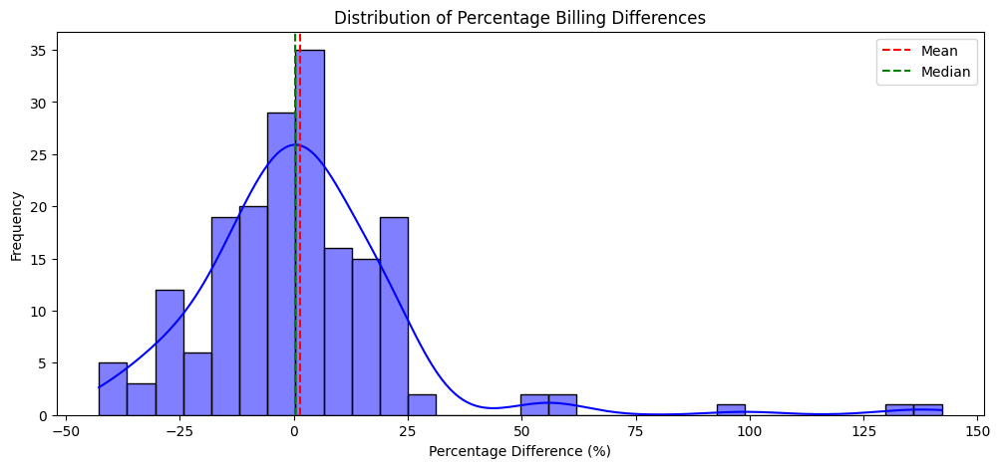

In [55]:

# Histogram: Percentage Differences
plt.figure(figsize=(12, 5))
sns.histplot(final_scenarios["Pct diff"], bins=30, kde=True, color="blue")
plt.axvline(final_scenarios["Pct diff"].mean(), color='red', linestyle='dashed', label="Mean")
plt.axvline(final_scenarios["Pct diff"].median(), color='green', linestyle='dashed', label="Median")
plt.xlabel("Percentage Difference (%)")
plt.ylabel("Frequency")
plt.title("Distribution of Percentage Billing Differences")
plt.legend()
plt.show()

In [93]:
# print final scenarios arrange by "Pct diff abs"
print(final_scenarios[["Customer_ID", "Doll diff", "Pct diff abs"]].sort_values("Pct diff abs", ascending=False).head(10))

    Customer_ID  Doll diff  Pct diff abs
88        W0073     432.07    142.165702
90        W0073     429.31    133.408950
89        W0073     563.67     98.910297
47        S0463    1052.35     58.013319
46        S0463     962.01     57.016109
44        S0463     936.10     54.469071
45        S0463    1056.06     54.067642
62        W0011    -227.29     42.771923
136       W0213   -5427.66     42.305762
137       W0213   -5955.42     42.098574


Two "delinquent" sites represent top 7 most deviant predictions.
Why? 


In [86]:
df_W0073 = pd.read_csv(os.path.join(base_directory, 'full_profiles_real/S0463_profile.csv'))
def create_aircon_comparison_plot(df):
    """
    Creates an interactive line plot comparing gross_cons_bootstrapped_aircon and bootstrapped_aircon.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing 'timestamp', 'gross_cons_bootstrapped_aircon', and 'bootstrapped_aircon' columns
    
    Returns:
    plotly.graph_objects.Figure: Interactive Plotly figure
    """
    # Create figure
    fig = go.Figure()

            # Add traces
    fig.add_trace(
        go.Scatter(
            x=df['TS'],
            y=df['PV'],
            name='Solar Generation',
            line=dict(color="red", width=2),
            mode='lines'
        )
    )
    # Add traces
    fig.add_trace(
        go.Scatter(
            x=df['TS'],
            y=df['kWh'],
            name='Net Electricity Consumption',
            line=dict(color='#8884d8', width=2),
            mode='lines'
        )
    )


    
    
    # Update layout
    fig.update_layout(
        title='PV Generation and Net Electricity Consumption for S0463',
        xaxis_title='Timestamp',
        yaxis_title='Consumption/Generation (W)',
        hovermode='x unified',
        template='plotly_white',
        showlegend=True,
        height=600,
        width=1000,
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01
        )
    )
    
    # Update x-axis
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
    
    # Update y-axis
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
    
    return fig


create_aircon_comparison_plot(df_W0073)

In [94]:
# remove customer_ID W0073 and S0463
filtered_final_scenarios = final_scenarios[~final_scenarios['Customer_ID'].isin(['W0073', 'S0463'])]

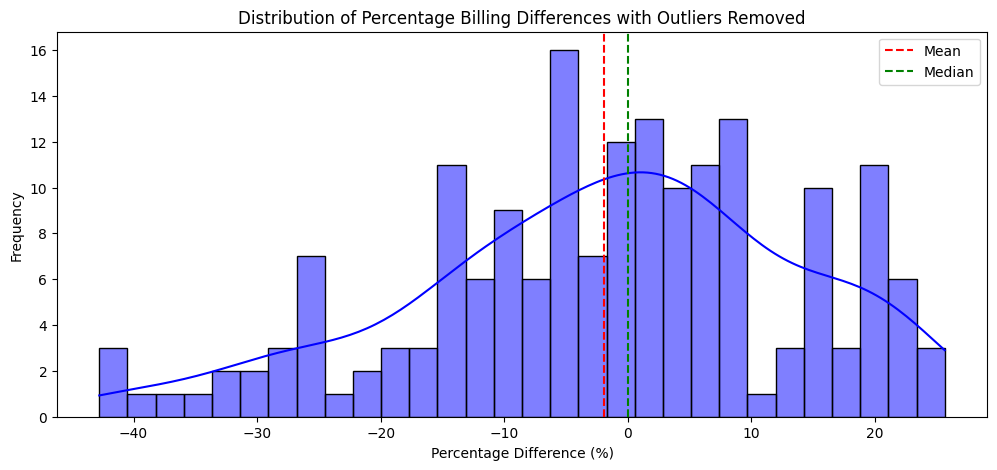

In [96]:

# Histogram: Percentage Differences
plt.figure(figsize=(12, 5))
sns.histplot(filtered_final_scenarios["Pct diff"], bins=30, kde=True, color="blue")
plt.axvline(filtered_final_scenarios["Pct diff"].mean(), color='red', linestyle='dashed', label="Mean")
plt.axvline(filtered_final_scenarios["Pct diff"].median(), color='green', linestyle='dashed', label="Median")
plt.xlabel("Percentage Difference (%)")
plt.ylabel("Frequency")
plt.title("Distribution of Percentage Billing Differences with Outliers Removed")
plt.legend()
plt.show()

Since it's bootstrapped - actual, it seems like the algorithm is *slightly* more like to under-predict the aircon consumption. 

In [99]:
# print final scenarios arrange by "Pct diff abs"
print(filtered_final_scenarios[["Customer_ID", "Doll diff", "Pct diff abs", "Tariff Type"]].sort_values("Pct diff abs", ascending=False).head(10))

    Customer_ID  Doll diff  Pct diff abs  Tariff Type
62        W0011    -227.29     42.771923          TOU
136       W0213   -5427.66     42.305762  Single_Rate
137       W0213   -5955.42     42.098574  Single_Rate
138       W0213   -4638.67     38.838415          TOU
139       W0213   -4989.28     38.190095          TOU
143       W0227   -2291.62     34.906945          TOU
140       W0227   -2075.66     33.593744  Single_Rate
141       W0227   -2097.93     33.342922  Single_Rate
142       W0227   -1848.28     30.137031          TOU
145       W0236   -2733.31     29.246525  Single_Rate


In [115]:
df_W0073 = pd.read_csv(os.path.join(base_directory, 'full_profiles_real/W0213_profile.csv'))
df_W0073_bootstrapped = pd.read_csv(os.path.join(base_directory, 'resampled_30min_data_bootstrapped_cons/W0213_processed_profile.csv'))
def create_aircon_comparison_plot(df, df_bootstrapped):
    """
    Creates an interactive line plot comparing gross_cons_bootstrapped_aircon and bootstrapped_aircon.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing 'timestamp', 'gross_cons_bootstrapped_aircon', and 'bootstrapped_aircon' columns
    
    Returns:
    plotly.graph_objects.Figure: Interactive Plotly figure
    """
    # Create figure
    fig = go.Figure()

            # Add traces
    # fig.add_trace(
    #     go.Scatter(
    #         x=df['TS'],
    #         y=df['PV'],
    #         name='Solar Generation',
    #         line=dict(color="red", width=2),
    #         mode='lines'
    #     )
    # )
    # Add traces
    # fig.add_trace(
    #     go.Scatter(
    #         x=df_bootstrapped['TS'],
    #         y=df_bootstrapped['kWh'],
    #         name='Net Electricity Consumption',
    #         line=dict(color='#8884d8', width=2),
    #         mode='lines'
    #     )
    # )

    # fig.add_trace(
    #     go.Scatter(
    #         x=df['TS'],
    #         y=df['pv_site_net_battery'],
    #         name='Battery Generation',
    #         line=dict(color='coral', width=2),
    #         mode='lines'
    #     )
    # )

    fig.add_trace(
        go.Scatter(
            x=df_bootstrapped['TS'],
            y=df_bootstrapped['gross_cons'],
            name='Gross Electricity Consumption',
            line=dict(color='green', width=2),
            mode='lines'
        )
    )
    
    fig.add_trace(
        go.Scatter(
            x=df_bootstrapped['TS'],
            y=df_bootstrapped['gross_cons_bootstrapped_aircon'],
            name='Bootstrapped Consumption',
            line=dict(color='purple', width=2),
            mode='lines'
        )
    )
    
    # Update layout
    fig.update_layout(
        title='Total and Bootstrapped Total Electricity Consumption for W0213',
        xaxis_title='Timestamp',
        yaxis_title='Consumption/Generation (kW)',
        hovermode='x unified',
        template='plotly_white',
        showlegend=True,
        height=600,
        width=1000,
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01
        )
    )
    
    # Update x-axis
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
    
    # Update y-axis
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
    
    return fig


create_aircon_comparison_plot(df_W0073, df_W0073_bootstrapped)

May 26
From 00:00 - 05:00: no solar generation, battery is *discharging*, net load is zero = battery is meeting consumption
From 05:00 - 08:00: no solar generation, battery stops discharging, net load is positive = battery stopped discharging so net load is positive
From 08:00 - 12:00: positive solar generation, battery is charging, net load is zero = battery is charging with excess solar 
    Gross Consumption = Solar + Battery (which is negative) + Net Load
From 12:00 - 18:00: positive solar generation, battery is also discharging for some reason, net load is super negative = exporting excess battery and solar generation to the grid 
From 18:00 - 24:00: no solar generation, battery is discharging, net load is near zero = battery discharge is meeting consumption
    Gross Consumption = battery (which is positive) + Net Load